In [0]:
# Change directory to VSCode workspace root so that relative path loads work correctly. Turn this addition off with the DataScience.changeDirOnImportExport setting
# ms-python.python added
import os
try:
	os.chdir(os.path.join(os.getcwd(), '../..'))
	print(os.getcwd())
except:
	pass


# Data Quality Exploration

## Conclusions

1. The number of orders with unique items calculated from complete orders with joined items matches the one in transactions dataset. This means that the transactions dataset is likely created correctly.
2. Only 0.1 % of the items in item dataset don't have a matching order in order dataset.
3. 7.6 % of the orders from orders dataset don't have any matching items from items dataset, but these are all from orders with states 'Place order' and 'Shopping Basket'. There is no such problem with completed orders.
4. Prices and item quantities have some outliers that are most likely errors.
5. Only around 20 % of the completed orders have matching price between
the order price and sum of the prices of the individual items.
The percent of the orders with matching prices also shows clear timetrends.
This difference almost always small and almost always the order paid is higher than the
total price of the order calculated from individual items. This discrepancy could
be caused by shipping costs and discounts that we do not see in the data as shipping cost
would be small, but raise the amount paid a bit and discounts should lower the amount
paid by a small amount and should be more rare the shipping costs.

#### All in all the data quality is good for the purposes of our analysis.

#### If we were to use the prices for the analysis, the dataset would need to cleaned with regards to item quantities and prices and the total amount paid per order. We would also want to make sure that the discrepancy between the amount paid and the price of the order calculated from individual items is indeed do to shipping cost and discounts as it seems.

In [1]:

import datetime
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
from IPython.core.interactiveshell import InteractiveShell
from IPython.display import HTML

# Setting styles
sns.set(style="whitegrid", color_codes=True)
InteractiveShell.ast_node_interactivity = "all"


In [2]:

raw_path = os.path.join("data", "raw")

# for trans we do not want the header
data_trans = pd.read_csv(
    os.path.join(raw_path, "trans.csv"), skiprows=1, header=None, sep="\n"
)
data_trans = data_trans[0].str.split(",", expand=True)
data_orders = pd.read_csv(
    os.path.join(raw_path, "orders_translated.csv"), sep=";", decimal=","
)
data_items = pd.read_csv(os.path.join(raw_path, "lineitems.csv"), sep=";", decimal=",")



### Dataset Contents

The rows in orders_translated.csv represent orders that are in varying
states of completion (see state column).

The rows in lineitems.csv represent products for for orders.
Each row is separate product type (sku), but can represent multiple items (see product_quantity)

The rows in the trans.csv are completed transactions with more than one unique product. Columns represent the product type and the column number represents the number of the items with value in column "3" represents the fourth unique item.

In [3]:

# Sample data
data_orders.head()
data_items.head()
data_trans.head()


,id_order,created_date,state,total_paid
0,241319,2017-01-02T13:35:40Z,Cancelled,44.99
1,241423,2017-11-06T13:10:02Z,Completed,136.15
2,242832,2017-12-31T17:40:03Z,Completed,15.76
3,243330,2017-02-16T10:59:38Z,Completed,84.98
4,243784,2017-11-24T13:35:19Z,Cancelled,157.86


,id,id_order,product_id,product_quantity,sku,date,unit_price
0,1119109,299539,0,1,OTT0127,2017-01-01T00:07:19Z,18.99
1,1119110,299540,0,1,LGE0037,2017-01-01T00:19:45Z,399.00
2,1119111,299541,0,1,PAR0065,2017-01-01T00:20:57Z,474.05
3,1119112,299542,0,1,WDT0309,2017-01-01T00:51:40Z,68.39
4,1119113,299543,0,1,JBL0098,2017-01-01T01:06:38Z,23.74


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,IFX0049,TUC0302,IFX0014,MOP0083,None,None,None,None,None,None,None,None,None
1,CRU0045,OWC0048,SEA0038,APP1130,None,None,None,None,None,None,None,None,None
2,APP0405,APP1208,None,None,None,None,None,None,None,None,None,None,None
3,BOS0059,APP1457,APP0432,APP2487,APP2552,None,None,None,None,None,None,None,None
4,LGE0038,ELA0004,APP1459,APP1208,LAC0221,None,None,None,None,None,None,None,None


### Number of Rows in Datasets

Items dataset naturally contains the most rows, followed by orders and then transcations,
that are just the orders with two or more unique products.

Text(0.5, 1.0, 'Number of Rows in Datasets')

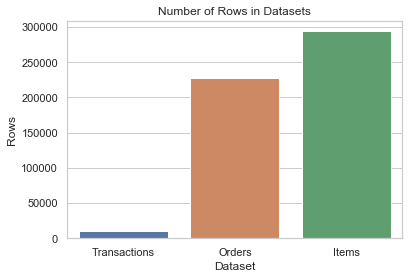

In [4]:

rows_list = [
    ("Transactions", len(data_trans)),
    ("Orders", len(data_orders)),
    ("Items", len(data_items)),
]
labels_list = ["Dataset", "Rows"]

row_counts_df = pd.DataFrame.from_records(rows_list, columns=labels_list)
sns.barplot("Dataset", "Rows", data=row_counts_df)
plt.title("Number of Rows in Datasets")
plt.show()


### The Number Missing Values

In the transactions data there are missing values starting from column 2.
This means that all transactions contain at least two unique items, but only some contain more than that.
This is just as we would expect from the description of the data.

The only other missing values are 5 missing total_paid column values in orders dataset.
Bearing in mind that there are over 200000 observations in this dataset, this is negligible.
These orders are also all in state "Pending" and so are not a problem for us, as we are interested mostly in
the completed orders.

Text(0.5, 1.0, 'Transactions Missing by Columns')

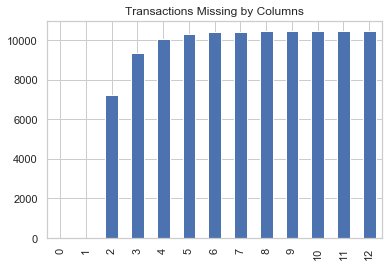

Text(0.5, 1.0, 'Orders Missing by Columns')

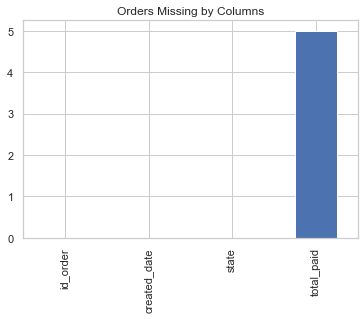

Text(0.5, 1.0, 'Items Missing by Columns')

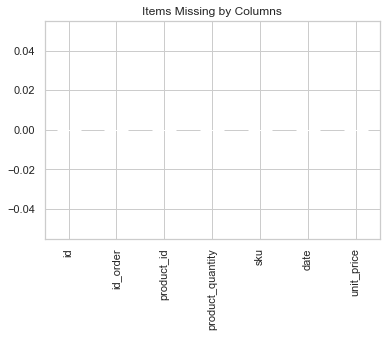

,id_order,created_date,state,total_paid
127701,427314,2017-11-20T18:54:39Z,Pending,NaN
132013,431655,2017-11-22T12:15:24Z,Pending,NaN
147316,447411,2017-11-27T10:32:37Z,Pending,NaN
148833,448966,2017-11-27T18:54:15Z,Pending,NaN
149434,449596,2017-11-27T21:52:08Z,Pending,NaN


In [5]:

# Number of missing values
data_trans.isnull().sum().plot(kind="bar")
plt.title("Transactions Missing by Columns")
plt.show()
data_orders.isnull().sum().plot(kind="bar")
plt.title("Orders Missing by Columns")
plt.show()
data_items.isnull().sum().plot(kind="bar")
plt.title("Items Missing by Columns")
plt.show()

# checking out more closely the 5 orders with missing values
data_orders[data_orders.total_paid.isnull()]


### Is All Data from the Right Period?

All the rows in orders and items datasets timestamps are within our designated period
2017-01-01 00:07:19 and 2018-03-14 13:58:36.

In [6]:

# correcting the datetime columns
data_orders.created_date = pd.to_datetime(data_orders.created_date)
data_items.date = pd.to_datetime(data_items.date)

# adding normalized versions for easier handling
data_orders["created_date_norm"] = data_orders["created_date"].dt.normalize()
data_items["date_norm"] = data_items["date"].dt.normalize()

print("Oldest date in orders: ", min(data_orders.created_date))
print("Newest date in orders: ", max(data_orders.created_date))
print("Oldest date in items: ", min(data_items.date))
print("Newest date in items: ", max(data_items.date))


Oldest date in orders:  2017-01-01 00:07:19+00:00
Newest date in orders:  2018-03-14 13:58:36+00:00
Oldest date in items:  2017-01-01 00:07:19+00:00
Newest date in items:  2018-03-14 13:58:36+00:00


### Are the ID Columns working?

There are no duplicate values in order dataset for id_order and no duplicate values in items for id.
As there were also no missing values in these columns, this means that these columns work as unique identifiers.

In [7]:

print(
    "Number of duplicates in orders dataset id_order: ",
    sum(data_orders.id_order.value_counts() > 1),
)
print(
    "Number of duplicates in orders dataset id: ", sum(data_items.id.value_counts() > 1)
)


Number of duplicates in orders dataset id_order:  0
Number of duplicates in orders dataset id:  0


### Are There Weird Values in the Paid Amount in Orders

There are lots of orders with total paid as zero or close to it,
there also some of orders that have very high amount paid.

Luckily the all rows with 0 amount paid are in shopping basket or place order state and not in completed orders.

There no orders that have a negative amount paid. This is good, as these would clearly be errors.

Minimum paid for order:  0.0
Maximum paid for order:  214747.53
Average paid for order:  569.2258182755703
Median paid for order:  112.99
Number of orders that have total paid below 0:  0


Text(0.5, 1.0, 'Distribution of the Amount Paid in Orders')

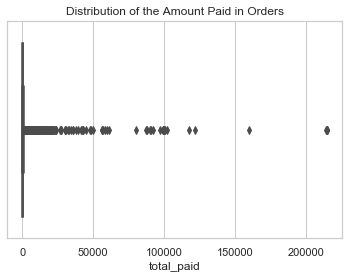

Text(0.5, 1.0, 'Number of Orders with 0 Paid by Order State')

(array([0, 1, 2, 3, 4]), <a list of 5 Text xticklabel objects>)

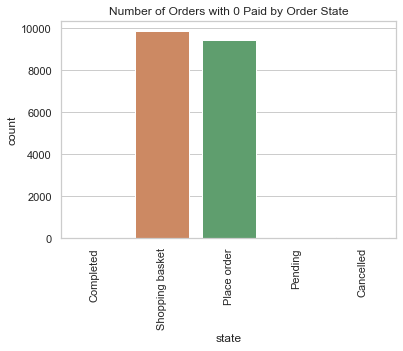

In [8]:

print("Minimum paid for order: ", data_orders.total_paid.min())
print("Maximum paid for order: ", data_orders.total_paid.max())
print("Average paid for order: ", data_orders.total_paid.mean())
print("Median paid for order: ", data_orders.total_paid.median())

sns.boxplot(data_orders.total_paid.dropna())
plt.title("Distribution of the Amount Paid in Orders")
plt.show()

# Lets inspect which kind of orders are those that have 0 paid
sns.countplot(x="state", data=data_orders[data_orders.total_paid == 0])
plt.title("Number of Orders with 0 Paid by Order State")
plt.xticks(rotation=90)
plt.show()

# Lets still check if there are any values that are below 0
print(
    "Number of orders that have total paid below 0: ",
    data_orders[data_orders.total_paid < 0].shape[0],
)


### Are There Weird Values in the Prices and Quantities of Items?

Product quantity has 1 as the lowest number which is good. The highest number 999 seems like error though (maybe should be missing).

The unit prices of the items are very varied and the highest and lowest price seem to be values that are clearly wrong.

There are 865 rows with 0 unit price. It is unclear what these rows could be, maybe giveaways?

There is only row with negative unit price. Probably a mistake, but could also be a refund that is marked in weird way

Text(0.5, 1.0, 'Distribution of product_quantity')

product_quantity minimum value:  1
product_quantity maximum value:  999
product_quantity average value:  1.1211260515063797
product_quantity median value:  1.0
unit_price minimum value:  -119.0
unit_price maximum value:  159989.83
unit_price average value:  409.8552027838344
unit_price median value:  92.99


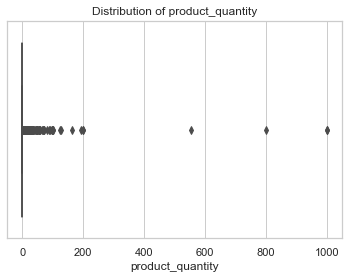

Text(0.5, 1.0, 'Distribution of unit_price')

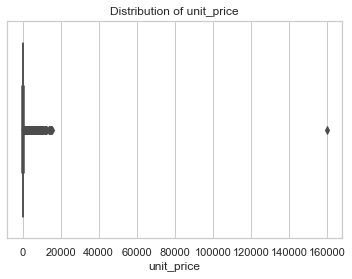

,id,id_order,product_id,product_quantity,sku,date,unit_price,date_norm
53515,1227566,345934,0,1,KIN0153-2,2017-04-13 13:47:21+00:00,0.0,2017-04-13 00:00:00+00:00
53530,1227590,345957,0,1,WDT0341,2017-04-13 14:44:05+00:00,0.0,2017-04-13 00:00:00+00:00
56529,1232832,348502,0,1,LIBRO,2017-04-21 18:14:54+00:00,0.0,2017-04-21 00:00:00+00:00
56562,1232888,348531,0,1,LIBRO,2017-04-21 19:46:54+00:00,0.0,2017-04-21 00:00:00+00:00
56576,1232909,348542,0,1,LIBRO,2017-04-21 20:48:06+00:00,0.0,2017-04-21 00:00:00+00:00
...,...,...,...,...,...,...,...,...
291880,1646431,525595,0,1,SYN0144,2018-03-11 20:50:46+00:00,0.0,2018-03-11 00:00:00+00:00
292216,1647014,525883,0,1,APP0693,2018-03-12 12:26:57+00:00,0.0,2018-03-12 00:00:00+00:00
292388,1647334,526025,0,1,WAC0245,2018-03-12 16:31:39+00:00,0.0,2018-03-12 00:00:00+00:00
292905,1648288,526430,0,1,OWC0104,2018-03-13 13:27:05+00:00,0.0,2018-03-13 00:00:00+00:00


,id,id_order,product_id,product_quantity,sku,date,unit_price,date_norm
77008,1268645,365886,0,1,APP1459,2017-06-15 12:48:54+00:00,-119.0,2017-06-15 00:00:00+00:00


In [9]:

items_check_list = ["product_quantity", "unit_price"]

for feature in items_check_list:
    sns.boxplot(x=data_items[feature])
    plt.title("Distribution of " + feature)
    print(feature + " minimum value: ", data_items[feature].min())
    print(feature + " maximum value: ", data_items[feature].max())
    print(feature + " average value: ", data_items[feature].mean())
    print(feature + " median value: ", data_items[feature].median())
    plt.show()


data_items[data_items.unit_price == 0]

data_items[data_items.unit_price < 0]


### How Well Do the Datasets Combine?

234 (0.1 %) of the items don't have a matching order
and 22213 (7.6 %) of the orders don't have a matching items.

The amount of items that don't match is very small and is not a cause for concern, but the amount of orders without items is big.
Luckily again it seems that all these problematic orders are in state "Place order" or "Shopping basket". This means there are no completed orders without any matching items.

Number of items with no matching order:  234
Number of orders with no matching items:  22213
Percent of items with no matching order:  0.1 %
Percent of orders with no matching items:  7.6 %
Number of duplicate item rows in joined data:  0


Text(0.5, 1.0, 'Number of Orders with no Matching Items by Order State')

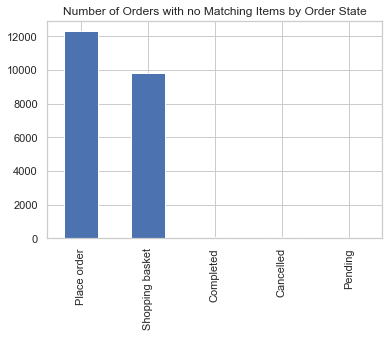

In [10]:

# Lets combine the orders and items with an inner join
data_orders_items = data_orders.join(
    data_items.set_index("id_order"), how="outer", on="id_order", lsuffix="_item"
)

# We use columns that don't have missing and only appear in one of the datasets to do check join quality
print(
    "Number of items with no matching order: ",
    data_orders_items.created_date.isnull().sum(),
)
print("Number of orders with no matching items: ", data_orders_items.id.isnull().sum())
print(
    "Percent of items with no matching order: ",
    data_orders_items.created_date.isnull()
    .multiply(100)
    .divide(data_orders.shape[0])
    .sum()
    .round(1),
    "%",
)
print(
    "Percent of orders with no matching items: ",
    data_orders_items.id.isnull()
    .multiply(100)
    .divide(data_items.shape[0])
    .sum()
    .round(1),
    "%",
)

# Check if duplicate items id
print(
    "Number of duplicate item rows in joined data: ",
    sum(data_orders_items.id.value_counts() > 1),
)

# Lets look more closely at the orders that don't have any items.
data_orders_items[data_orders_items.id.isnull()].state.value_counts().plot(kind="bar")
plt.title("Number of Orders with no Matching Items by Order State")
plt.show()


### Does the Amount Paid in Orders Data Match the Prices of the Items in the Order?

Only 28 % of the completed orders have a matching number for amount paid and the prices
of the individual items in the order. There is also clear differences by time on how
big of a percent of the orders has a matching price, with the amount of matching orders
having a downward trend.

This seems quite bad, but if we look at the how big the differences are, we see that
the daily sales values calculated from the different prices is almost identical and
if we look at the distribution of the difference in prices when these don't match,
we see that most of these differences are small and usually the order paid
is higher than the price calculated from items. My conclusion from this is that
the differences are probably caused by shipping prices and discounts.
On top of these, there are rare extreme differences and these are
probably true errors.

Percent of completed orders with a matching total paid and sum of item prices:  28.0 %
/home/tuomo/anaconda3/envs/product-associations-discovery/lib/python3.7/site-packages/seaborn/relational.py:792: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  x, y = np.asarray(x), np.asarray(y)
Minimum price difference:  -165.0
Maximum price difference:  3985.0
Average price difference:  6.0
Median price difference:  5.0


Text(0.5, 0, 'Date')

Text(0, 0.5, 'Percent of Orders with Matching Prices')

Text(0.5, 1.0, 'Percent of Completed Orders Whose Price Paid and Price Calculated from Items Matches')

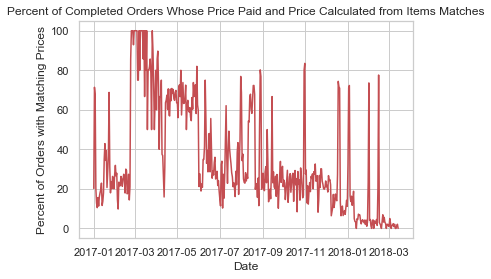

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Price')

(0, 175000)

Text(0.5, 1.0, 'Daily Sales Value Calculated from Total Paid per Order and from Individual Items in the Orders')

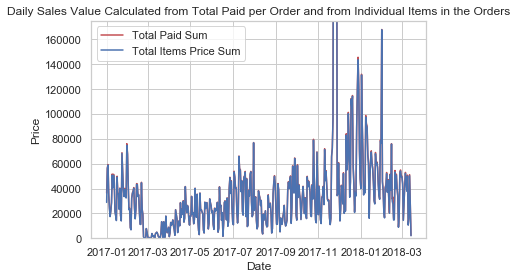

Text(0, 0.5, 'Total Paid - Total Items Price')

Text(0.5, 1.0, 'Percent of Completed Orders Whose Price Paid and Price Calculated from Items Matches')

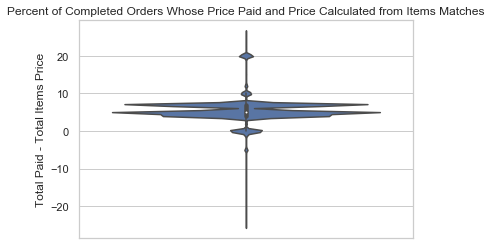

In [11]:

# Adding total price to items that takes into account the number of items
data_orders_items["total_orders_price"] = (
    data_orders_items["unit_price"] * data_orders_items["product_quantity"]
)

# Adding order price calculated from items within order to the joined dataset
data_orders_items_total_price = (
    data_orders_items[["id_order", "total_orders_price"]]
    .groupby(["id_order"], as_index=False)
    .sum()
)

data_orders_items_total_price.columns = ["id_order", "total_order_price"]

data_completed_orders = (
    data_orders_items.join(
        data_orders_items_total_price.set_index("id_order"), how="left", on="id_order"
    )
    .query("state == 'Completed'")
    .drop_duplicates(subset="id_order")[
        [
            "id_order",
            "created_date",
            "created_date_norm",
            "total_paid",
            "total_order_price",
        ]
    ]
)

# Checking percent matching
print(
    "Percent of completed orders with a matching total paid and sum of item prices: ",
    np.round(
        data_completed_orders.query("total_paid == total_order_price").shape[0]
        * 100
        / data_completed_orders.shape[0]
    ),
    "%",
)


data_completed_orders["matching_price"] = (
    data_completed_orders.total_paid == data_completed_orders.total_order_price
)

# Creating a timeline plot of the sum of both of the prices
data_completed_orders_ts = (
    data_completed_orders[
        ["created_date_norm", "total_paid", "total_order_price", "matching_price"]
    ]
    .groupby(["created_date_norm"])
    .agg(
        {
            "total_paid": ["sum"],
            "total_order_price": ["sum"],
            "matching_price": ["sum", "count"],
        }
    )
)

data_completed_orders_ts["matching_prices_percent"] = (
    data_completed_orders_ts.matching_price["sum"]
    .multiply(100)
    .divide(data_completed_orders_ts.matching_price["count"])
    .round(1)
)

sns.lineplot(
    data_completed_orders_ts.index,
    data_completed_orders_ts.matching_prices_percent,
    color="r",
)
plt.xlabel("Date")
plt.ylabel("Percent of Orders with Matching Prices")
plt.title(
    "Percent of Completed Orders Whose Price Paid and Price Calculated from Items Matches"
)
plt.show()

fig, ax = plt.subplots()
sns.lineplot(
    data_completed_orders_ts.index,
    data_completed_orders_ts.total_paid["sum"],
    color="r",
    ax=ax,
)
sns.lineplot(
    data_completed_orders_ts.index,
    data_completed_orders_ts.total_order_price["sum"],
    color="b",
    ax=ax,
)
ax.legend(("Total Paid Sum", "Total Items Price Sum"), loc="upper left")
plt.xlabel("Date")
plt.ylabel("Price")
plt.ylim([0, 175000])
plt.title(
    "Daily Sales Value Calculated from Total Paid per Order and from Individual Items in the Orders"
)
plt.show()

data_price_diff = data_completed_orders.dropna(
    subset=["total_paid", "total_order_price"]
).query("matching_price == False")[["total_paid", "total_order_price"]]

data_price_diff["price_diff"] = data_price_diff.apply(
    lambda row: row.total_paid - row.total_order_price, axis=1
)

print("Minimum price difference: ", data_price_diff.price_diff.min().round())
print("Maximum price difference: ", data_price_diff.price_diff.max().round())
print("Average price difference: ", data_price_diff.price_diff.mean().round())
print("Median price difference: ", data_price_diff.price_diff.median().round())

plot = sns.violinplot(
    y="price_diff", data=data_price_diff[data_price_diff.price_diff.abs() <= 30]
)
plt.ylabel("Total Paid - Total Items Price")
plt.title(
    "Percent of Completed Orders Whose Price Paid and Price Calculated from Items Matches"
)
plt.show()



### How Many Completed Orders with 2 or More Unique There Are?

Average number of of unique items per order is around 1.3 and the median is 1. Only
about 20 %
10453 orders. This matches the rows we have in trans.csv.
Everything looks to be in order

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Unique Items')

Text(0.5, 1.0, 'Unique Items per Order by Date')

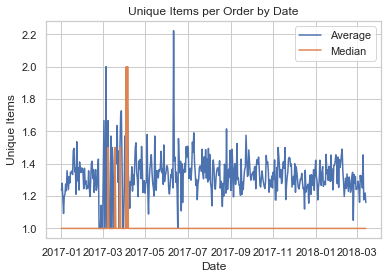

Text(0.5, 1.0, 'Percent of Completed Orders with 2 or More Unique Products')

Text(0, 0.5, 'Percent of Orders')

Text(0.5, 0, 'Date')

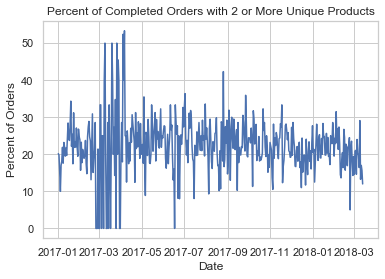

Text(0.5, 1.0, 'Number of Rows in Datasets')

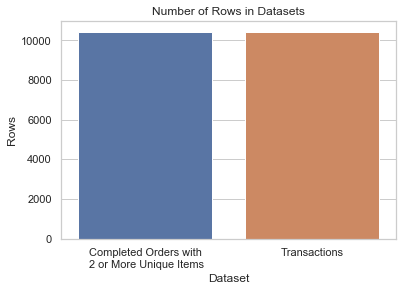

Percent of Completed Orders with 2 or More Unique Products:  22.4 %
Rows in Completed Orders with 2 or More Unique Items:  10453
Rows in Transaction Dataset:  10453


In [12]:

data_orders_items_ts = (
    data_orders_items[data_orders_items.state == "Completed"][
        ["created_date_norm", "id_order", "product_quantity"]
    ]
    .groupby(["created_date_norm", "id_order"])
    .agg(["sum", "count"])
)

fig, ax = plt.subplots()

sns.lineplot(
    data_orders_items_ts.index.get_level_values("created_date_norm"),
    data_orders_items_ts.product_quantity["count"],
    estimator="mean",
    label="Average",
    ci=None,
    ax=ax,
)

sns.lineplot(
    data_orders_items_ts.index.get_level_values("created_date_norm"),
    data_orders_items_ts.product_quantity["count"],
    estimator="quantile",
    label="Median",
    ci=None,
    ax=ax,
)

plt.xlabel("Date")
plt.ylabel("Unique Items")
plt.title("Unique Items per Order by Date")
plt.show()

data_orders_items_ts["two_or_more"] = (
    data_orders_items_ts.product_quantity["count"] >= 2
)

sns.lineplot(
    data_orders_items_ts.index.get_level_values("created_date_norm"),
    data_orders_items_ts.two_or_more * 100,
    estimator="mean",
    ci=None,
)
plt.title("Percent of Completed Orders with 2 or More Unique Products")
plt.ylabel("Percent of Orders")
plt.xlabel("Date")
plt.show()

rows_list = [
    (
        "Completed Orders with\n 2 or More Unique Items",
        data_orders_items_ts.two_or_more.sum(),
    ),
    ("Transactions", data_trans.shape[0]),
]
labels_list = ["Dataset", "Rows"]

row_counts_df = pd.DataFrame.from_records(rows_list, columns=labels_list)
sns.barplot("Dataset", "Rows", data=row_counts_df)
plt.title("Number of Rows in Datasets")
plt.show()

print(
    "Percent of Completed Orders with 2 or More Unique Products: ",
    np.round(
        data_orders_items_ts.two_or_more.sum()
        * 100
        / data_orders_items_ts.two_or_more.count(),
        1,
    ),
    "%",
)
print(
    "Rows in Completed Orders with 2 or More Unique Items: ",
    data_orders_items_ts.two_or_more.sum(),
)
print("Rows in Transaction Dataset: ", data_trans.shape[0])

